### For image naming and spliting libraries

In [ ]:
# For image naming and spliting
import os
import random
import shutil
import pandas as pd

### For image transformation libraries

In [ ]:
# For image trnasformation
import albumentations as A
import cv2
from PIL import Image
import numpy as np
import random
import matplotlib.pyplot as plt
import scipy.misc
import copy
from albumentations.pytorch import transforms
from functools import partial
import seaborn as sns
from scipy.stats import skew, kurtosis

### Model libraries

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
from tf_explain.core.activations import ExtractActivations
from keras._tf_keras.keras import layers
from keras import Sequential
import requests
from keras._tf_keras.keras.models import Model
from keras._tf_keras.keras.optimizers import SGD
from keras._tf_keras.keras.preprocessing.image import img_to_array, array_to_img, ImageDataGenerator

## Define paths

In [ ]:
# Define paths
dataset_path = 'Carrot_Hector_M/Train'
train_path = 'Carrot_Hector_M/Train/Train'
val_path = 'Carrot_Hector_M/Train/Val'
test_path = 'Carrot_Hector_M/Train/Test'


## Get list of Carrot classes
### Create train, validation, and test folders
### Define split percentages

In [ ]:
# Get list of fruit classes
disease_classes = [disease_class for disease_class in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, disease_class))]
print(disease_classes)

# Create train, validation, and test folders
os.makedirs(train_path, exist_ok=True)
os.makedirs(val_path, exist_ok=True)
os.makedirs(test_path, exist_ok=True)

# Define split percentages
train_split = 0.8  # 80% for training
val_split = 0.1    # 10% for validation
test_split = 0.1   # 10% for testing

['aster_yellow_bacteria_Candidatus_Phytoplasma_asteris', 'Carrot', 'Carrot_plant', 'root_knot_nematode_Meloidogyne_fallax', 'rust_fly_Chamaepsila_rosae']


# Rename images

In [ ]:
def rename_images(dataset_path):
    """
    Renames images in each class folder of the dataset path according to the format <class_name>_1, <class_name>_2, ...

    Parameters:
    - dataset_path (str): Path to the dataset directory containing class folders.
    """
    for disease_class in disease_classes:
        class_path = os.path.join(dataset_path, disease_class)
        if os.path.isdir(class_path):
            images = os.listdir(class_path)
            for i, image in enumerate(images, start=1):
                image_ext = os.path.splitext(image)[1]
                new_image_name = f"{disease_class}_{i:03d}{image_ext}"
                old_image_path = os.path.join(class_path, image)
                new_image_path = os.path.join(class_path, new_image_name)
                os.rename(old_image_path, new_image_path)

# Rename images before splitting
rename_images(dataset_path)

# Create train, validation, and test sets for each fruit class
## Create folders for each carrot class in train, validation, and test sets
## Move images to respective folders based on splits

In [ ]:
# Create train, validation, and test sets for each fruit class
for disease_class in disease_classes:
    disease_class_path = os.path.join(dataset_path, disease_class)
    disease_images = os.listdir(disease_class_path)
    random.shuffle(disease_images)

    print("\n")
    print("Disease Class: " + str(disease_class))
    # Calculate split sizes
    num_images = len(disease_images)
    print("Number of images: " + str(num_images))
    train_size = int(train_split * num_images)
    print("Training images: " + str(train_size))
    val_size = int(val_split * num_images)
    print("Validation images: " + str(val_size))
    test_size = num_images - train_size - val_size
    print("Testing images: " + str(test_size))

    # Create folders for each fruit class in train, validation, and test sets
    train_disease_path = os.path.join(train_path, disease_class)
    print(train_disease_path)
    val_disease_path = os.path.join(val_path, disease_class)
    print(val_disease_path)
    test_disease_path = os.path.join(test_path, disease_class)
    print(test_disease_path)
    os.makedirs(train_disease_path, exist_ok=True)
    os.makedirs(val_disease_path, exist_ok=True)
    os.makedirs(test_disease_path, exist_ok=True)

    # Move images to respective folders based on splits
    for i, img in enumerate(disease_images):
        img_path = os.path.join(disease_class_path, img)
        if i < train_size:
            shutil.copy(img_path, os.path.join(train_disease_path, img))
        elif i < train_size + val_size:
            shutil.copy(img_path, os.path.join(val_disease_path, img))
        else:
            shutil.copy(img_path, os.path.join(test_disease_path, img))

print("Train, validation, and test sets created successfully.")

# Class distribution

Number of images in each category:
Carrot: 394 images
Carrot_plant: 194 images
aster_yellow_bacteria_Candidatus_Phytoplasma_asteris: 146 images
root_knot_nematode_Meloidogyne_fallax: 158 images
rust_fly_Chamaepsila_rosae: 266 images


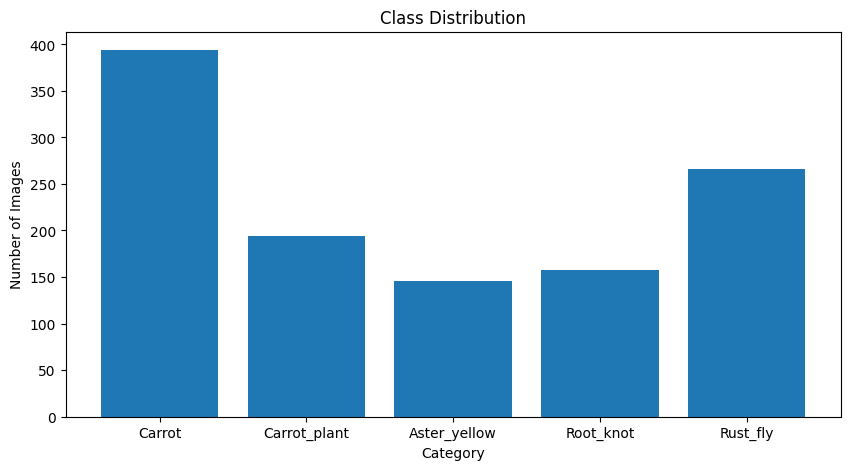

In [ ]:
# Path to the main folder containing subfolders
main_folder_path = 'Carrot_Hector_M/Train'

# Dictionary to hold file paths
image_paths = {
    'Carrot': [],
    'Carrot_plant': [],
    'aster_yellow_bacteria_Candidatus_Phytoplasma_asteris': [],
    'root_knot_nematode_Meloidogyne_fallax': [],
    'rust_fly_Chamaepsila_rosae':[]
}

# List all files in the subfolders
for category in image_paths.keys():
    folder_path = os.path.join(main_folder_path, category)
    for file_name in os.listdir(folder_path):
        if file_name.endswith('.jpg') or file_name.endswith('.png'):
            image_paths[category].append(os.path.join(folder_path, file_name))

# Check the number of images in each category
category_counts = {category: len(paths) for category, paths in image_paths.items()}
print("Number of images in each category:")
for category, count in category_counts.items():
    print(f"{category}: {count} images")

names= ['Carrot', 'Carrot_plant','Aster_yellow','Root_knot','Rust_fly']

# Plot the class distribution
plt.figure(figsize=(10, 5))
plt.bar(category_counts.keys(), category_counts.values())
plt.xticks([0,1,2,3,4],names)
plt.xlabel('Category')
plt.ylabel('Number of Images')
plt.title('Class Distribution')
plt.show()

## Image samples

Random Visual Inspection for: Carrot


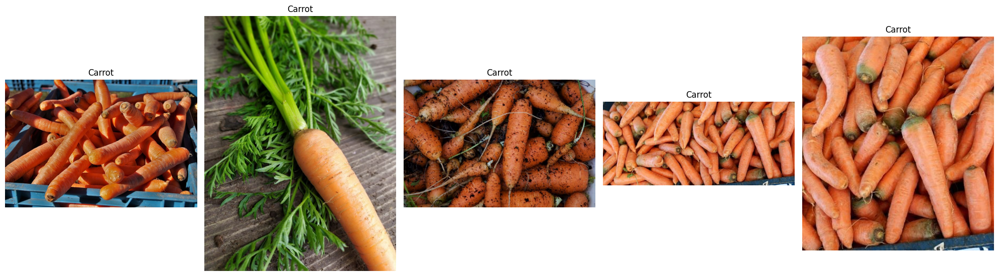

Random Visual Inspection for: Carrot_plant


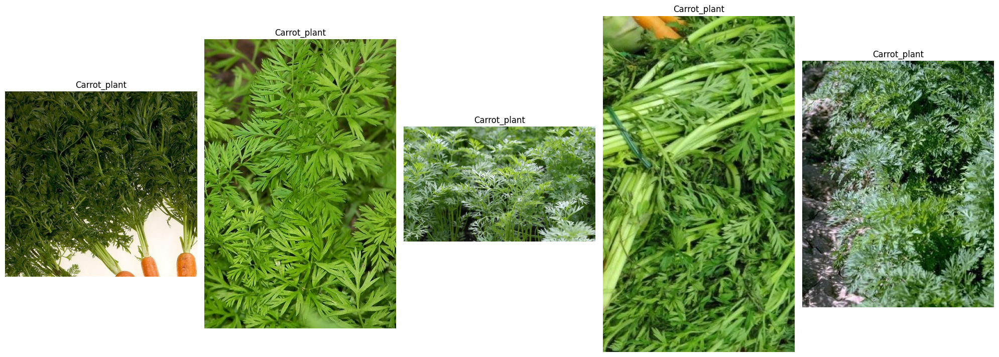

Random Visual Inspection for: aster_yellow_bacteria_Candidatus_Phytoplasma_asteris


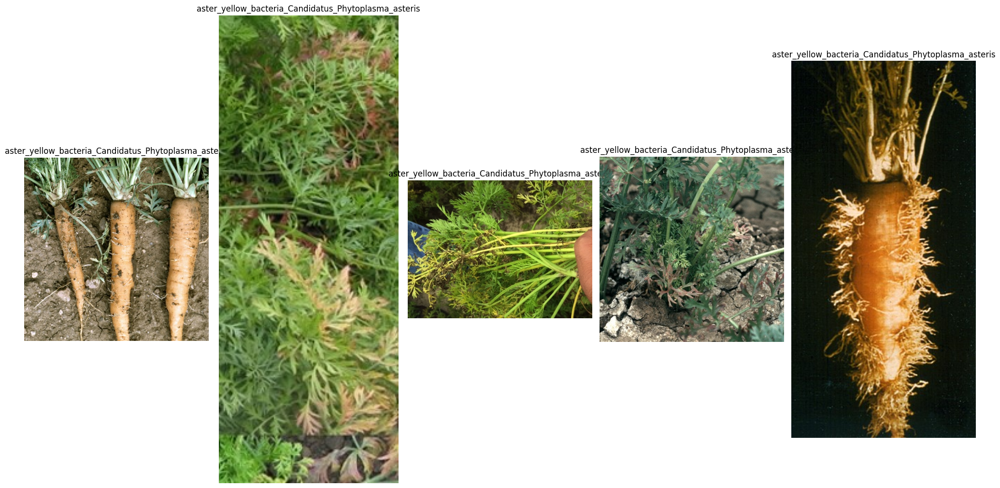

Random Visual Inspection for: root_knot_nematode_Meloidogyne_fallax


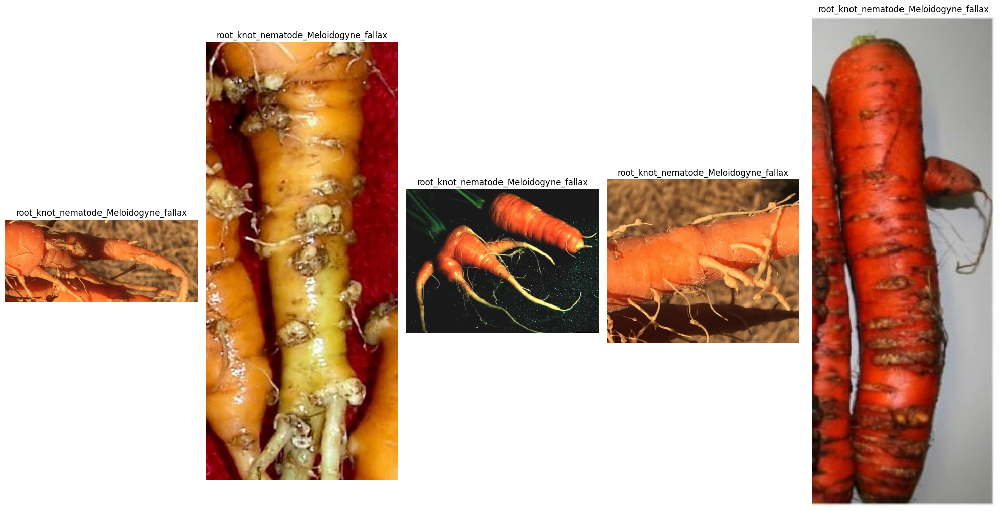

Random Visual Inspection for: rust_fly_Chamaepsila_rosae


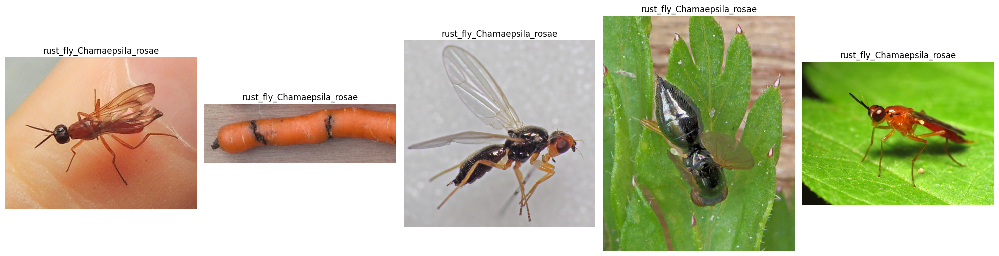

In [ ]:
for category, paths in image_paths.items():
    num_samples = 5  # Number of random samples to display
    print("Random Visual Inspection for: " + str(category))
# Get a list of all image files in the folder
    image_files = [i for i in paths if i.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif', '.tiff'))]

# Select random samples
    random_samples = random.sample(image_files, min(len(image_files), num_samples))

# Create a figure to display the images
    plt.figure(figsize=(20, 10))

# Loop through the random samples and display each image
    for i, filename in enumerate(random_samples):
    # Construct full file path
        file_path = os.path.join(category, filename)

    # Open the image file
        img = Image.open(file_path)

    # Add a subplot for each image
        plt.subplot(1, num_samples, i + 1)
        plt.imshow(img)
        plt.axis('off')  # Hide the axes
        plt.title(category)  # Show the filename as the title

# Adjust layout to prevent overlap
    plt.tight_layout()

# Display the plot
    plt.show()


## Image dimensions distribution

### Statistics of image dimensions

In [ ]:
#distribution of image dimensions for sampled images
dimensions = []
labels = []
for category, paths in image_paths.items():
    for image_file in paths:
        try:
            image = cv2.imread(image_file)
            if image is not None:
                dimensions.append(image.shape[:2])
                labels.append(category)
        except Exception as e:
            print(f"Error loading image {image_file}: {e}")

dimensions_df = pd.DataFrame(dimensions, columns=['Height', 'Width'])
dimensions_df['Category'] = labels

# Display basic statistics of image dimensions
grouped_stats = dimensions_df.groupby('Category').describe()
print(grouped_stats)

                                                   Height              \
                                                    count        mean   
Category                                                                
Carrot                                              316.0  606.072785   
Carrot_plant                                        155.0  443.883871   
aster_yellow_bacteria_Candidatus_Phytoplasma_as...  116.0  380.275862   
root_knot_nematode_Meloidogyne_fallax               126.0  407.373016   
rust_fly_Chamaepsila_rosae                          212.0  546.188679   

                                                                               \
                                                           std    min     25%   
Category                                                                        
Carrot                                              272.596098  107.0  418.75   
Carrot_plant                                        147.360982  131.0  342.00   
aster_yell

## Image dimensions scatter plot

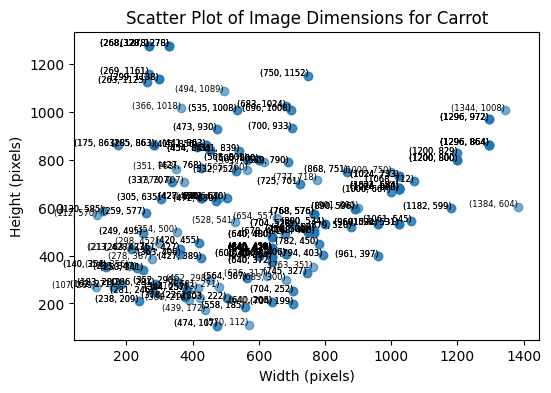

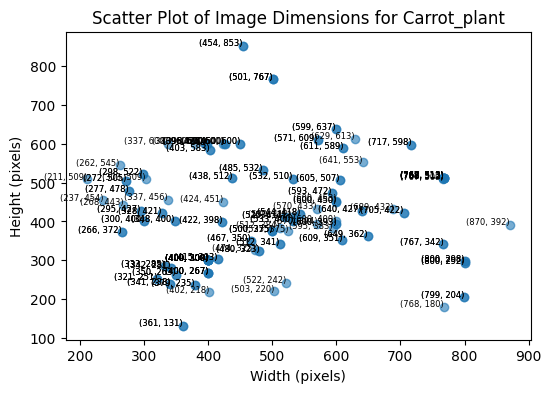

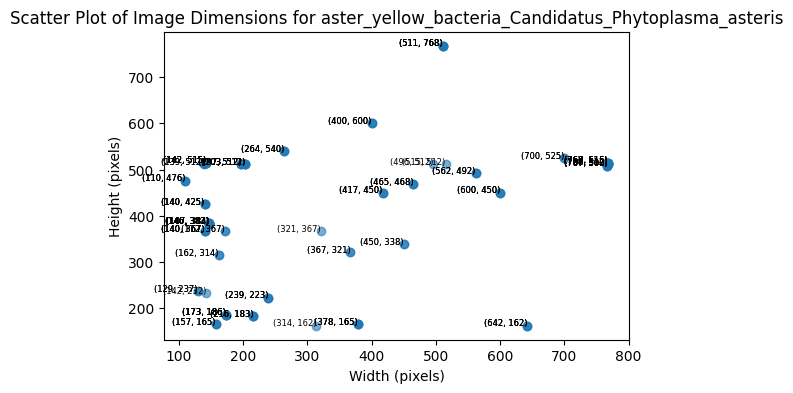

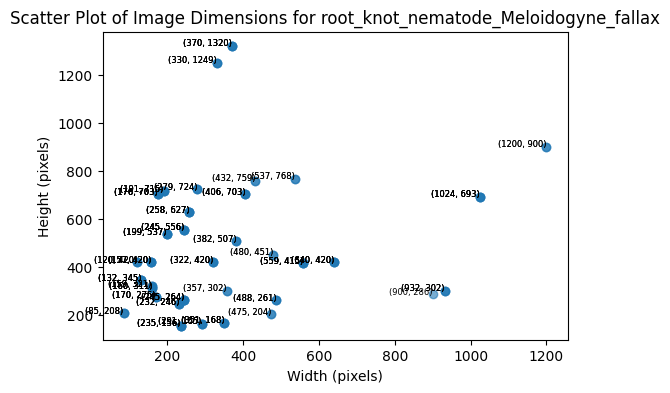

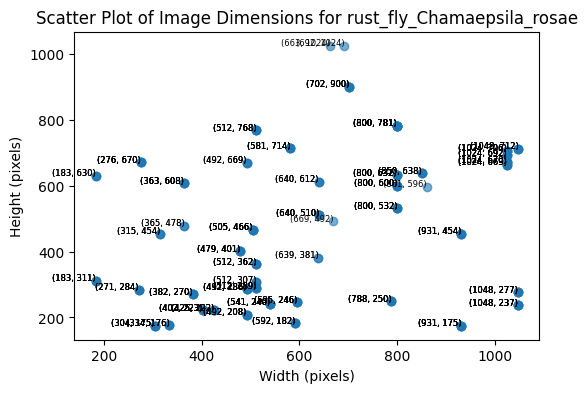

In [ ]:
# Traverse the directory and collect image dimensions
for category, paths in image_paths.items():
    widths = []
    heights = []
    for image_file in paths:
        if image_file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif', '.tiff')):
            # Construct full file path
            file_path = os.path.join(category, image_file)  #folder_path

        # Open the image file
            with Image.open(file_path) as img:
            # Get width and height
                width, height = img.size

            # Append to lists
            widths.append(width)
            heights.append(height)

    # Create a scatter plot
    plt.figure(figsize=(6, 4))
    plt.scatter(widths, heights, alpha=0.6)

# Label the axes
    plt.xlabel('Width (pixels)')
    plt.ylabel('Height (pixels)')

# Title of the plot
    plt.title('Scatter Plot of Image Dimensions for '+ str(category))

# Text labels for scatterplot points
    [plt.text(i, j, f'({i}, {j})', fontsize=6, ha='right') for (i, j) in zip(widths, heights)]


# Display the plot
    plt.show()


In [ ]:
def extract_rgb_values(image_path):
    img = cv2.imread(image_path)
    # Convert image to RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

# Function to update histograms with RGB values
def update_histograms(image_path, red_hist, green_hist, blue_hist):
    img = extract_rgb_values(image_path)
    red_hist += cv2.calcHist([img], [0], None, [256], [0, 256]).flatten()
    green_hist += cv2.calcHist([img], [1], None, [256], [0, 256]).flatten()
    blue_hist += cv2.calcHist([img], [2], None, [256], [0, 256]).flatten()
    return red_hist, green_hist, blue_hist

RGB Histograms for Carrot :


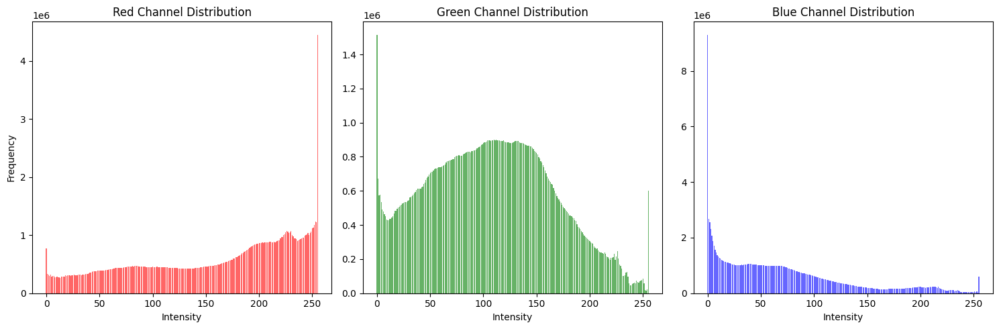

RGB Histograms for Carrot_plant :


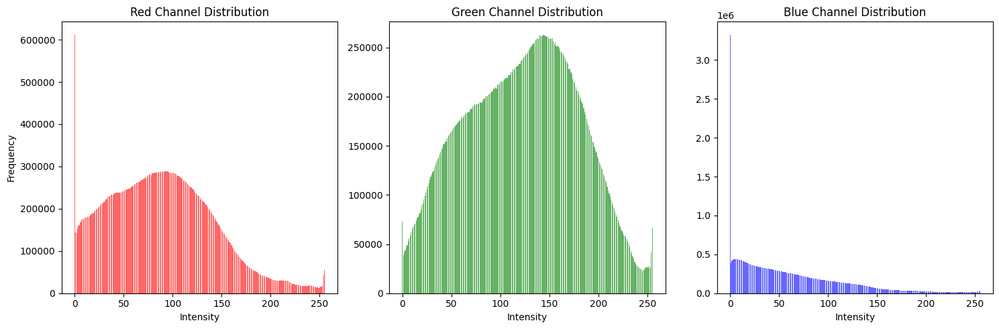

RGB Histograms for aster_yellow_bacteria_Candidatus_Phytoplasma_asteris :


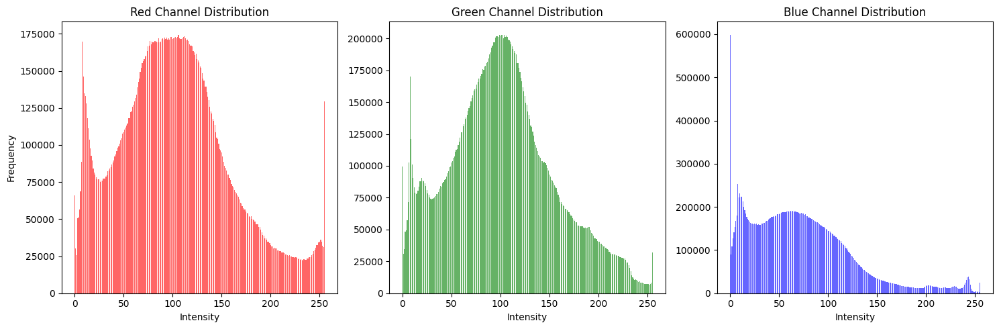

RGB Histograms for root_knot_nematode_Meloidogyne_fallax :


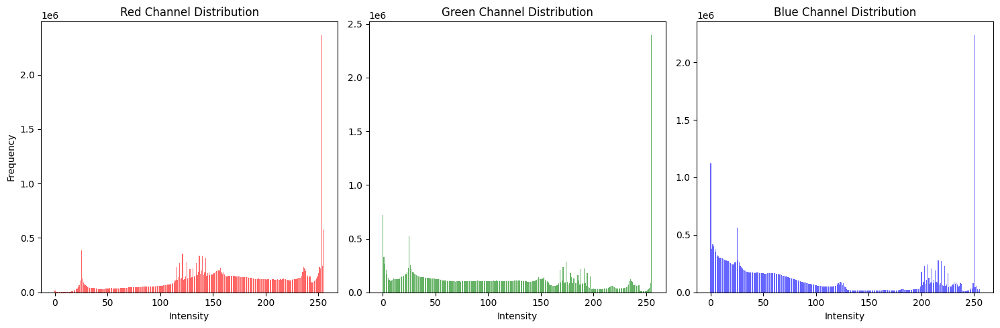

RGB Histograms for rust_fly_Chamaepsila_rosae :


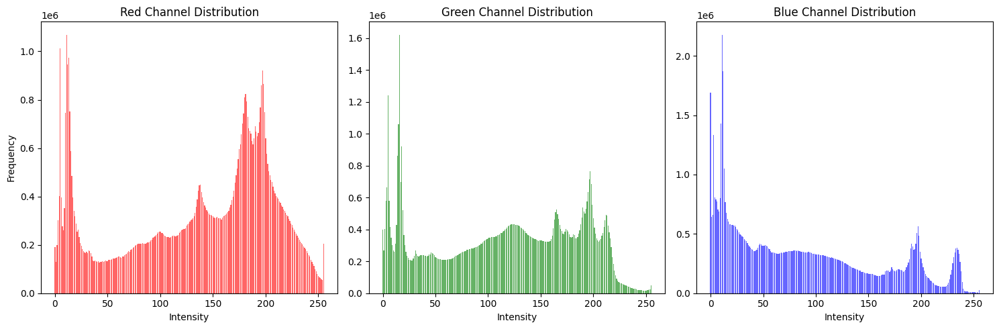

In [ ]:
# Plot RGB histograms for each category
for category, paths in image_paths.items():
    # Initialize histograms for RGB values
    red_hist = np.zeros(256)
    green_hist = np.zeros(256)
    blue_hist = np.zeros(256)

    # Traverse the directory and process images
    for image_file in paths:
        if image_file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif', '.tiff')):
            # Construct full file path
            file_path = os.path.join(category, image_file)
            # Update histograms
            red_hist, green_hist, blue_hist = update_histograms(file_path, red_hist, green_hist, blue_hist)


    print("RGB Histograms for "+ str(category)+ " :")
    # Plot the RGB histograms
    plt.figure(figsize=(15, 5))

    # Plot Red values
    plt.subplot(1, 3, 1)
    plt.bar(range(256), red_hist, color='red', alpha=0.6)
    plt.title('Red Channel Distribution')
    plt.xlabel('Intensity')
    plt.ylabel('Frequency')

    # Plot Green values
    plt.subplot(1, 3, 2)
    plt.bar(range(256), green_hist, color='green', alpha=0.6)
    plt.title('Green Channel Distribution')
    plt.xlabel('Intensity')

    # Plot Blue values
    plt.subplot(1, 3, 3)
    plt.bar(range(256), blue_hist, color='blue', alpha=0.6)
    plt.title('Blue Channel Distribution')
    plt.xlabel('Intensity')

    # Adjust layout and display the plot
    plt.tight_layout()
    plt.show()

In [ ]:
# Function to calculate total energy of an image
def calculate_total_energy(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    energy = np.sum(np.square(img))
    return energy

# Calculate and display total energy for a few sample images from each category
for category, paths in image_paths.items():
    print(f'Total energy for {category}:')
    for img_path in paths[:3]:
        energy = calculate_total_energy(img_path)
        print(f'{os.path.basename(img_path)}: {energy}')




Total energy for Carrot:
Carrot_002.jpg: 45427985
Carrot_003.png: 4331281
Carrot_004.jpg: 50268685
Total energy for Carrot_plant:
Carrot_plant_001.jpg: 12226796
Carrot_plant_002.jpg: 15070637
Carrot_plant_003.jpg: 15070637
Total energy for aster_yellow_bacteria_Candidatus_Phytoplasma_asteris:
aster_yellow_bacteria_Candidatus_Phytoplasma_asteris_001.jpg: 28962651
aster_yellow_bacteria_Candidatus_Phytoplasma_asteris_002.jpg: 28962651
aster_yellow_bacteria_Candidatus_Phytoplasma_asteris_003.jpg: 5227563
Total energy for root_knot_nematode_Meloidogyne_fallax:
root_knot_nematode_Meloidogyne_fallax_001.jpg: 45432603
root_knot_nematode_Meloidogyne_fallax_002.jpg: 45432603
root_knot_nematode_Meloidogyne_fallax_003.jpg: 45432603
Total energy for rust_fly_Chamaepsila_rosae:
rust_fly_Chamaepsila_rosae_001.jpg: 58650783
rust_fly_Chamaepsila_rosae_002.jpg: 64629968
rust_fly_Chamaepsila_rosae_003.jpg: 10601262


In [ ]:
# Function to detect blurriness using the variance of the Laplacian
def calculate_laplacian_variance(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    laplacian = cv2.Laplacian(img, cv2.CV_64F)
    variance = laplacian.var()
    return variance

def identify_outliers(blurriness_scores, threshold=2.0):
    mean = np.mean(blurriness_scores)
    std_dev = np.std(blurriness_scores)
    skewness = skew(blurriness_scores)
    kurt = kurtosis(blurriness_scores)
    if abs(skewness) > 1 or kurt > 3:
        print("The data has a heavy tail.")
        threshold = 3.0
    print(threshold)
    lower_bound = mean - threshold * std_dev
    upper_bound = mean + threshold * std_dev
    outliers = [(i, score) for i, score in enumerate(blurriness_scores) if score < lower_bound or score > upper_bound]
    return outliers

def analyze_blurriness(folder_path, threshold=2.0):
    image_names = []
    blurriness_scores = []

    for image_file in paths:
        if image_file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif', '.tiff')):
            file_path = os.path.join(folder_path, image_file)
            variance = calculate_laplacian_variance(file_path)
            image_names.append(image_file)
            blurriness_scores.append(variance)

    print("Maximum Blurriness Score: " + str(max(blurriness_scores)))
    print("Minimum Blurriness Score: " + str(min(blurriness_scores)))
    outliers = identify_outliers(blurriness_scores, threshold)

    return outliers, image_names, blurriness_scores

In [ ]:
def calculate_mad(values):
    """Calculate the Median Absolute Deviation (MAD) of a list of values."""
    median = np.median(values)
    deviations = np.abs(values - median)
    mad = np.median(deviations)
    return median, mad

def process_images_in_folder(folder_path):
    """Calculate the MAD of blurriness scores for all images in the specified folder."""
    blurriness_scores = []

    for image_file in paths:
        if image_file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif', '.tiff')):
            image_path = os.path.join(folder_path, image_file)
            blurriness_score = calculate_laplacian_variance(image_path)
            blurriness_scores.append(blurriness_score)

    if not blurriness_scores:
        raise ValueError("No valid images found in the folder.")

    median, mad = calculate_mad(np.array(blurriness_scores))
    return blurriness_scores, median, mad

def plot_blurriness_scores(blurriness_scores, median, mad):
    """Plot the blurriness scores with median and MAD highlighted."""
    plt.figure(figsize=(10, 6))
    plt.hist(blurriness_scores, bins=30, alpha=0.7, color='gray', edgecolor='black')
    plt.axvline(median, color='red', linestyle='dashed', linewidth=2, label=f'Median: {median:.2f}')
    plt.axvspan(median - mad, median + mad, alpha=0.2, color='red', label=f'MAD range: [{median - mad:.2f}, {median + mad:.2f}]')
    plt.title(f'Blurriness Scores Distribution with Median and MAD in {category}')
    plt.xlabel('Blurriness Score')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()

def detect_outliers(blurriness_scores, median, mad, threshold=2.0):
    """Detect outliers in the blurriness scores using MAD."""
    skewness = skew(blurriness_scores)
    kurt = kurtosis(blurriness_scores)
    if abs(skewness) > 1 or kurt > 3:
        print("The data has a heavy tail.")
        threshold = 3.0
    print(threshold)
    lower_bound = median - threshold * mad
    upper_bound = median + threshold * mad
    outliers = [(i, score) for i, score in enumerate(blurriness_scores) if score < lower_bound or score > upper_bound]
    return outliers

def detect_blurriness(category, blurriness_scores, median, mad):
    image_names = []

    for image_file in paths:
        if image_file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif', '.tiff')):
            image_names.append(image_file)

    print("Maximum Blurriness Score: " + str(max(blurriness_scores)))
    print("Minimum Blurriness Score: " + str(min(blurriness_scores)))
    outliers = detect_outliers(blurriness_scores, median, mad)

    return outliers, image_names

In [ ]:
for category, paths in image_paths.items():
    blurriness_scores, median, mad_value = process_images_in_folder(category)
    # print(f"Median Absolute Deviation (MAD) of blurriness scores: {mad_value}")
    outlier_score, image_names = detect_blurriness(category, blurriness_scores, median, mad_value)

    # Print outliers
    print("*"*45)
    print("Outliers for: " + str(category))
    print("*"*45 + "\n")
    for idx, score in outlier_score:
        print(f'{os.path.basename(image_names[idx])}: {score}')


Maximum Blurriness Score: 1078.4316432396859
Minimum Blurriness Score: 18.01050048096334
2.0
*********************************************
Outliers for: Carrot
*********************************************

Carrot_003.png: 980.7679445890632
Carrot_007.jpg: 55.526781657437866
Carrot_008.jpg: 55.5267816574379
Carrot_011.jpg: 890.9252553664932
Carrot_012.jpg: 890.9252553664929
Carrot_015.jpg: 53.0593768845533
Carrot_016.jpg: 53.05937688455331
Carrot_029.jpg: 41.76367272971677
Carrot_030.jpg: 41.76367272971675
Carrot_038.jpg: 35.41979436648274
Carrot_039.jpg: 35.41979436648276
Carrot_066.jpg: 974.0171165240575
Carrot_067.jpg: 974.0171165240574
Carrot_068.jpg: 55.526781657437866
Carrot_079.jpg: 55.52678165743791
Carrot_082.jpg: 1021.2309779312013
Carrot_083.jpg: 1021.2309779312014
Carrot_088.png: 980.7679445890631
Carrot_089.jpg: 55.5267816574379
Carrot_102.jpg: 860.9601896916607
Carrot_103.jpg: 860.9601896916607
Carrot_117.jpg: 890.9252553664932
Carrot_122.jpg: 39.01051107384992
Carrot_123

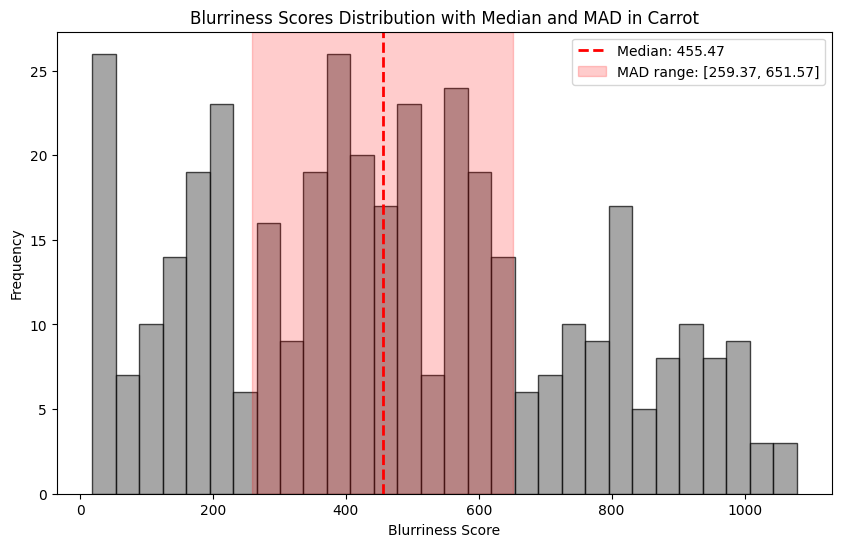

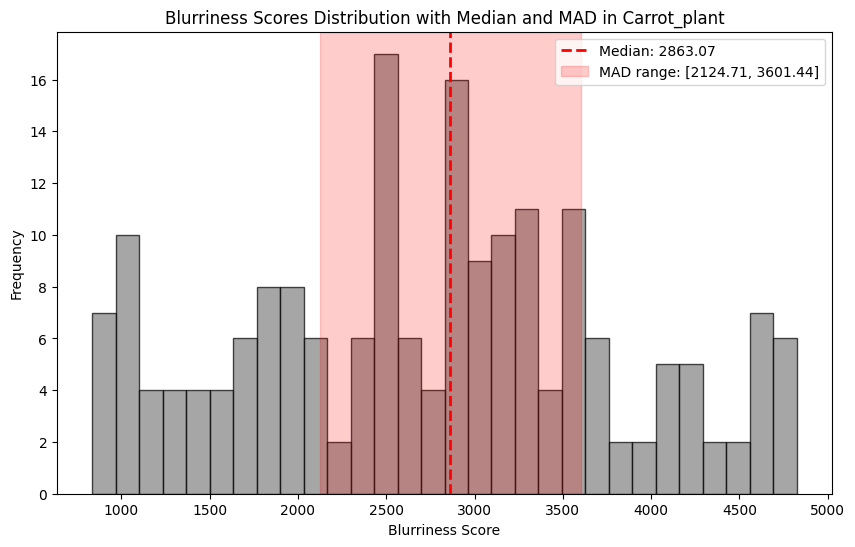

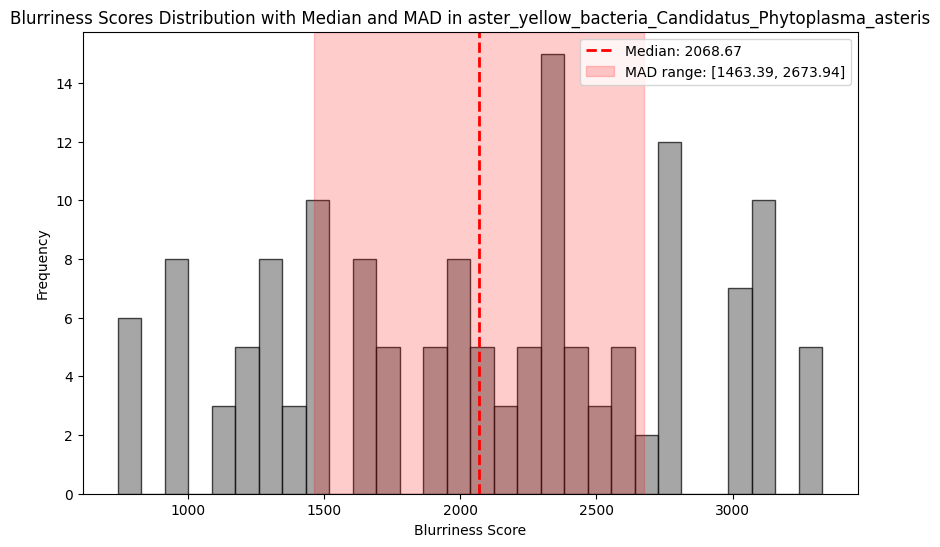

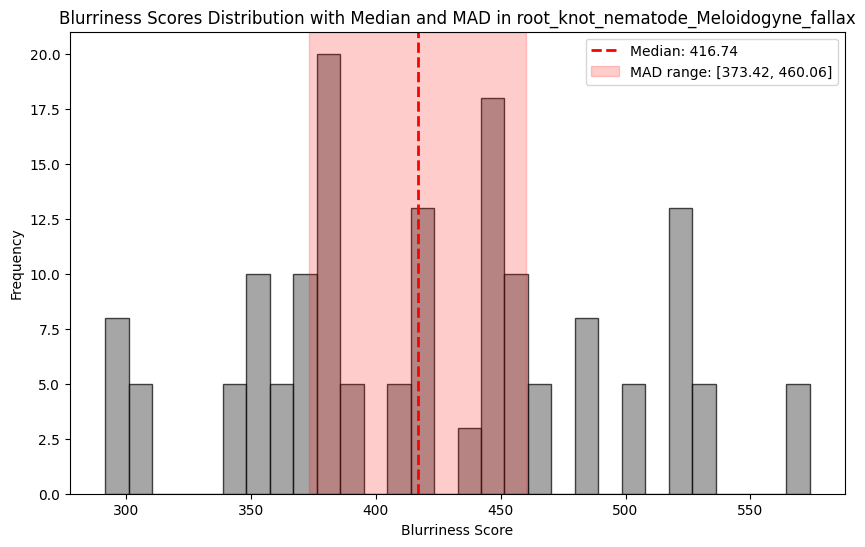

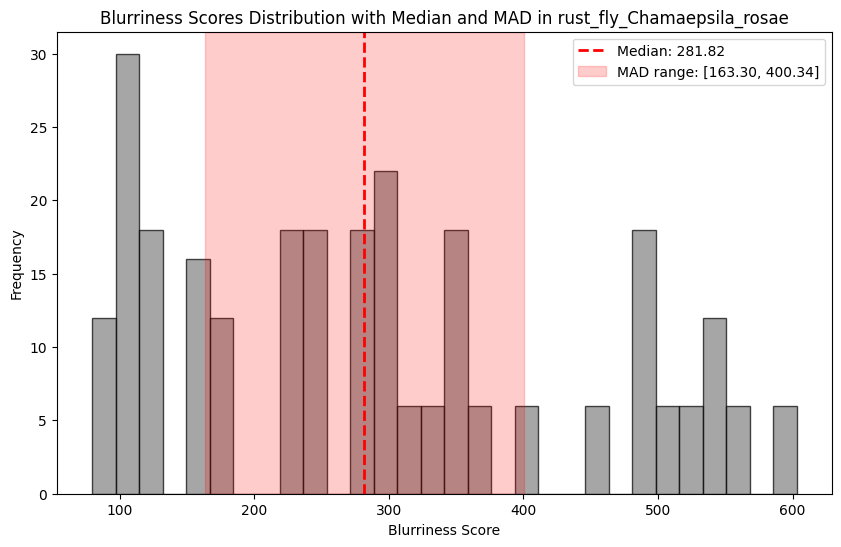

In [ ]:
for category, paths in image_paths.items():
    blurriness_scores, median, mad_value = process_images_in_folder(folder_path)
    # print(f"Median Absolute Deviation (MAD) of blurriness scores: {mad_value}")
    plot_blurriness_scores(blurriness_scores, median, mad_value)

In [ ]:
# Define paths
train_path = 'Carrot_Hector_M/Train/Train'
C_Outliers_path= 'Carrot_Hector_M/Train/Train/Carrot_Outliers'
Cp_Outliers_path= 'Carrot_Hector_M/Train/Train/Carrot_plant_Outliers'
AYB_Outliers_path= 'Carrot_Hector_M/Train/Train/aster_yellow_bacteria_Candidatus_Phytoplasma_asteris_Outliers'
RKN_Outliers_path= 'Carrot_Hector_M/Train/Train/root_knot_nematode_Meloidogyne_fallax_Outliers'
RF_Outliers_path= 'Carrot_Hector_M/Train/Train/rust_fly_Chamaepsila_rosae_Outliers'

os.makedirs(C_Outliers_path, exist_ok=True)
os.makedirs(Cp_Outliers_path, exist_ok=True)
os.makedirs(AYB_Outliers_path, exist_ok=True)
os.makedirs(RKN_Outliers_path, exist_ok=True)
os.makedirs(RF_Outliers_path, exist_ok=True)


# Removing outliers to another folder

In [ ]:
# Move outliers to another folder

for category, paths in image_paths.items():
    blurriness_scores, median, mad_value = process_images_in_folder(category)
    outlier_score, image_names = detect_blurriness(category, blurriness_scores, median, mad_value)

    for idx, score in outlier_score:
        print(f'{os.path.basename(image_names[idx])}')
        if category == "Carrot":
            shutil.move((os.path.join(f'{os.path.dirname(image_names[idx])}/{os.path.basename(image_names[idx])}')),C_Outliers_path,copy_function = shutil.copytree)
        elif category == 'Carrot_plant':
            shutil.move((os.path.join(f'{os.path.dirname(image_names[idx])}/{os.path.basename(image_names[idx])}')),Cp_Outliers_path,copy_function = shutil.copytree )
        elif category == 'aster_yellow_bacteria_Candidatus_Phytoplasma_asteris':
            shutil.move((os.path.join(f'{os.path.dirname(image_names[idx])}/{os.path.basename(image_names[idx])}')),AYB_Outliers_path,copy_function = shutil.copytree )
        elif category == 'root_knot_nematode_Meloidogyne_fallax':
            shutil.move((os.path.join(f'{os.path.dirname(image_names[idx])}/{os.path.basename(image_names[idx])}')),RKN_Outliers_path,copy_function = shutil.copytree )
        elif category == 'rust_fly_Chamaepsila_rosae':
            shutil.move((os.path.join(f'{os.path.dirname(image_names[idx])}/{os.path.basename(image_names[idx])}')),RF_Outliers_path,copy_function = shutil.copytree )




Maximum Blurriness Score: 1078.4316432396859
Minimum Blurriness Score: 18.01050048096334
2.0
Carrot_003.png
Carrot_007.jpg
Carrot_008.jpg
Carrot_011.jpg
Carrot_012.jpg
Carrot_015.jpg
Carrot_016.jpg
Carrot_029.jpg
Carrot_030.jpg
Carrot_038.jpg
Carrot_039.jpg
Carrot_066.jpg
Carrot_067.jpg
Carrot_068.jpg
Carrot_079.jpg
Carrot_082.jpg
Carrot_083.jpg
Carrot_088.png
Carrot_089.jpg
Carrot_102.jpg
Carrot_103.jpg
Carrot_117.jpg
Carrot_122.jpg
Carrot_123.jpg
Carrot_124.jpg
Carrot_125.jpg
Carrot_132.jpg
Carrot_133.jpg
Carrot_134.jpg
Carrot_137.jpg
Carrot_138.jpg
Carrot_157.jpg
Carrot_158.jpg
Carrot_169.jpg
Carrot_175.jpg
Carrot_176.jpg
Carrot_177.jpg
Carrot_178.jpg
Carrot_179.jpg
Carrot_180.jpg
Carrot_208.jpg
Carrot_209.jpg
Carrot_217.jpg
Carrot_218.jpg
Carrot_257.jpg
Carrot_258.jpg
Carrot_259.jpg
Carrot_260.jpg
Carrot_265.jpg
Carrot_266.jpg
Carrot_267.jpg
Carrot_268.jpg
Carrot_275.jpg
Carrot_276.jpg
Carrot_277.jpg
Carrot_293.jpg
Carrot_294.jpg
Carrot_295.jpg
Carrot_296.jpg
Carrot_300.jpg
Carrot_

# Image augmentation

In [ ]:
train_path = 'Carrot_Hector_M/Train/Train'

# Dictionary to hold file paths
image_paths = {
    'Carrot': [],
    'Carrot_plant': [],
    'aster_yellow_bacteria_Candidatus_Phytoplasma_asteris': [],
    'root_knot_nematode_Meloidogyne_fallax': [],
    'rust_fly_Chamaepsila_rosae':[]
}
# List all files in the subfolders
for category in image_paths.keys():
    folder_path = os.path.join(train_path, category)
    for file_name in os.listdir(folder_path):
        if file_name.endswith('.jpg') or file_name.endswith('.png'):
            image_paths[category].append(os.path.join(folder_path, file_name))

# Check the number of images in each category
category_counts = {category: len(paths) for category, paths in image_paths.items()}
print("Number of images in each category:")
for category, count in category_counts.items():
    print(f"{category}: {count} images")

Number of images in each category:
Carrot: 316 images
Carrot_plant: 155 images
aster_yellow_bacteria_Candidatus_Phytoplasma_asteris: 116 images
root_knot_nematode_Meloidogyne_fallax: 126 images
rust_fly_Chamaepsila_rosae: 212 images


### Images needed to match max number of images Carrots

In [ ]:
# Calculate number of images needed to match max number of images Carrots
max_count = max(category_counts.values())
augmentation_counts = {category: max_count - count for category, count in category_counts.items()}

print("Number of augmented images needed for each category:")
for category, count in augmentation_counts.items():
    print(f"{category}: {count} images")

Number of augmented images needed for each category:
Carrot: 0 images
Carrot_plant: 161 images
aster_yellow_bacteria_Candidatus_Phytoplasma_asteris: 200 images
root_knot_nematode_Meloidogyne_fallax: 190 images
rust_fly_Chamaepsila_rosae: 104 images


## Image augmentation options

In [ ]:
# Augmentation with Albumnetations

transform = A.Compose([
    A.Resize(height=299, width=299, p=1.0),
    A.RandomCrop(height=234, width=234, p=0.2),
    A.Transpose(always_apply=False, p=0.4),
    A.GaussNoise(always_apply=False, p=0.1, var_limit=(10.0, 50.0), per_channel=True, mean=0.0),
    A.RandomBrightnessContrast(p=0.5),
    A.Sharpen(always_apply=False, p=0.3, alpha=(0.2, 0.5), lightness=(0.5, 1.0)),
    A.HorizontalFlip(p=0.4),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))
])


## Process augmentations

In [ ]:
# Loading images
def load_rgb(image_path):
    image = cv2.imread(image_path)
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)


# Create directories to save augmented images
augmented_dir = 'Carrot_Hector_M/train/Train/Aug'
os.makedirs(augmented_dir, exist_ok=True)

# Function to augment and save images
def augment_images(image_paths, category, num_augmented_images):
    category_dir = os.path.join(augmented_dir, category)
    os.makedirs(category_dir, exist_ok=True)

    augmented_count = 0
    while augmented_count < num_augmented_images:
        for img_path in image_paths:
            if augmented_count >= num_augmented_images:
                break
            img = load_rgb(img_path)
            augmented = transform(image=img)
            aug_img = array_to_img(augmented['image'])
            for _ in range(num_augmented_images - augmented_count):
                aug_img.save(os.path.join(category_dir, f'{category}_aug_{augmented_count}.jpg'))
                augmented_count += 1

# Augment images for each underrepresented category
for category, num_augmented_images in augmentation_counts.items():
    if num_augmented_images > 0:
        print(f"Augmenting {num_augmented_images} images for {category}...")
        augment_images(image_paths[category], category, num_augmented_images)


Augmenting 161 images for Carrot_plant...
Augmenting 200 images for aster_yellow_bacteria_Candidatus_Phytoplasma_asteris...
Augmenting 190 images for root_knot_nematode_Meloidogyne_fallax...
Augmenting 104 images for rust_fly_Chamaepsila_rosae...


### Preprocess images

In [ ]:
# Define image size
IMG_SIZE = (299, 299)

# Function to preprocess images
def preprocess_image(image_path, img_size=IMG_SIZE):
    img = Image.open(image_path)
    img = img.resize(img_size)
    img_array = img_to_array(img) / 255.0  # Normalize the image
    return img_array

# Preprocess and store images
preprocessed_images = {category: [] for category in image_paths.keys()}

for category, paths in image_paths.items():
    for img_path in paths:
        preprocessed_images[category].append(preprocess_image(img_path))

print("Image preprocessing completed.")

Image preprocessing completed.


# Calling for image paths

In [ ]:
batch_size = 32
img_height = 299
img_width = 299

# Calling image paths
train_ds = tf.keras.utils.image_dataset_from_directory(
  train_path,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

class_names = train_ds.class_names

val_ds = tf.keras.utils.image_dataset_from_directory(
  val_path,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)


Found 1777 files belonging to 11 classes.
Using 1422 files for training.
Found 114 files belonging to 5 classes.
Using 22 files for validation.


# MODEL (In progress......)

In [ ]:

# Model to train data
base_model= tf.keras.applications.Xception(
    include_top=True,
    weights="imagenet",
    input_tensor=None,
    input_shape=(img_height, img_width, 3),
    pooling=None,
    classes=1000,
    classifier_activation="softmax",
)

print(base_model.summary)
num_classes = len(class_names)

#for layer in model.layers:
#    layer.trainable = True

model = Sequential([
  #base_model,
  tf.keras.layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.MaxPooling2D(),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout(0.2),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])
for layer in model.layers:
    layer.trainable = True


model.compile(optimizer='rmsprop', loss='categorical_crossentropy')
model.summary()

epochs=10
# train the model on the new data for a few epochs
#model.fit(val_ds, epochs=epochs)

# at this point, the top layers are well trained and we can start fine-tuning
# convolutional layers from inception V3. We will freeze the bottom N layers
# and train the remaining top layers.

# let's visualize layer names and layer indices to see how many layers
# we should freeze:
for i, layer in enumerate(base_model.layers):
   print(i, layer.name)

# we chose to train the top 2 inception blocks, i.e. we will freeze
# the first 249 layers and unfreeze the rest:
for layer in model.layers[:249]:
   layer.trainable = False
for layer in model.layers[249:]:
   layer.trainable = True

# we need to recompile the model for these modifications to take effect
# we use SGD with a low learning rate

model.compile(optimizer=SGD(lr=0.0001, momentum=0.9), loss='categorical_crossentropy')


model.summary()

# we train our model again (this time fine-tuning the top 2 inception blocks
# alongside the top Dense layers
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)


# To visualize training results
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()


accuracy_score = model.evaluate(val_ds)
print(accuracy_score)
print("Accuracy: {:.4f}%".format(accuracy_score[1] * 100))

print("Loss: ",accuracy_score[0])